## **Imports and Google Drive**

In [ ]:
# Install required packages
!pip install torch torchvision matplotlib tqdm

# Import necessary libraries
import os
import numpy as np
import random
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import save_image, make_grid
from google.colab import drive

# Set random seeds for reproducibility
torch.manual_seed(42)
torch.cuda.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Mount Google Drive
drive.mount('/content/drive')

# Create directories for saving models and results
SAVE_DIR = '/content/drive/MyDrive/face_cgan'
MODEL_DIR = f'{SAVE_DIR}/models'
RESULTS_DIR = f'{SAVE_DIR}/results'

os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(RESULTS_DIR, exist_ok=True)

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 37.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 27.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

## **Dataset preparation**

UTKFace dataset found at /content/drive/MyDrive/UTKFace/utkface/UTKFace
Total files: 15570
Loading dataset...


100%|██████████| 15570/15570 [00:00<00:00, 361030.23it/s]


Successfully loaded 15570 images with age information
Age group boundaries: [20, 26, 34, 50, 117]
Age group distribution:
  Group 0: 3049 images (19.6%)
  Group 1: 2003 images (12.9%)
  Group 2: 4058 images (26.1%)
  Group 3: 3192 images (20.5%)
  Group 4: 3268 images (21.0%)
Dataset size: 15570
Number of batches: 243
Visualizing sample images...


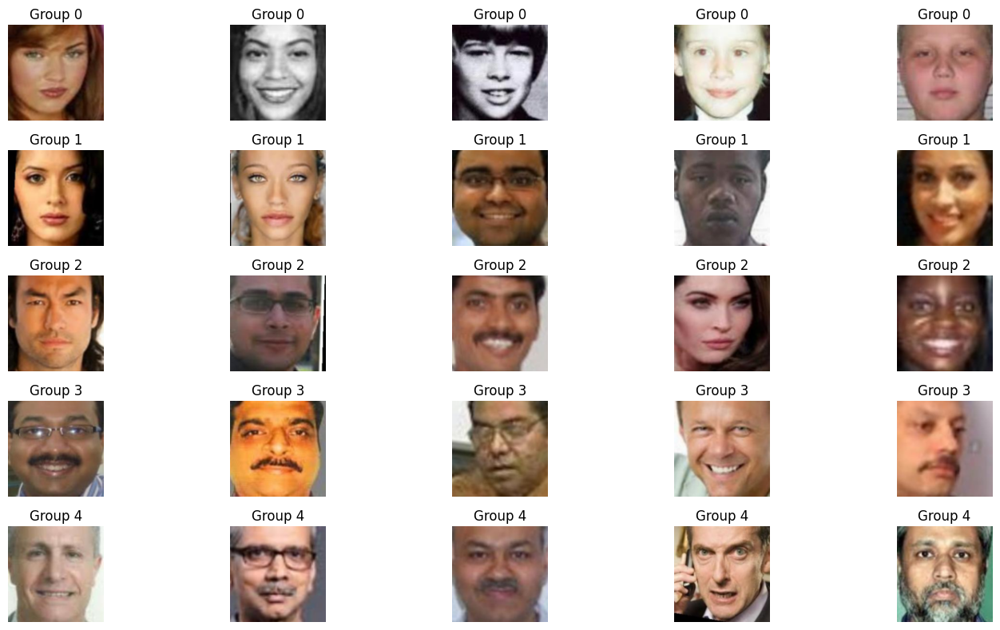

In [ ]:
# Path to UTKFace dataset on your Google Drive
UTK_FACE_DIR = '/content/drive/MyDrive/UTKFace/utkface/UTKFace'  # Adjust path if needed

# Verify the dataset exists
if os.path.exists(UTK_FACE_DIR):
    print(f"UTKFace dataset found at {UTK_FACE_DIR}")
    print(f"Total files: {len(os.listdir(UTK_FACE_DIR))}")
else:
    print(f"UTKFace dataset not found at {UTK_FACE_DIR}")
    print("Please check the path and ensure the dataset is available in your Google Drive")

class FaceAgeDataset(Dataset):
    def __init__(self, root_dir, transform=None, image_size=128, age_groups=5):
        self.root_dir = root_dir
        self.transform = transform
        self.image_size = image_size
        self.age_groups = age_groups

        # Load all images and parse age from filenames
        self.image_paths = []
        self.ages = []

        print("Loading dataset...")
        for filename in tqdm(os.listdir(root_dir)):
            if filename.endswith('.jpg') or filename.endswith('.png') or filename.endswith('.jpeg'):
                try:
                    # UTKFace filename format: [age]_[gender]_[race]_[date&time].jpg
                    age = int(filename.split('_')[0])
                    self.image_paths.append(os.path.join(root_dir, filename))
                    self.ages.append(age)
                except Exception as e:
                    # Skip files that don't follow the expected naming pattern
                    continue

        print(f"Successfully loaded {len(self.image_paths)} images with age information")

        # Define age group boundaries
        self.age_boundaries = self._get_age_boundaries()
        print(f"Age group boundaries: {self.age_boundaries}")

        # Count samples in each age group for reporting
        age_group_counts = [0] * self.age_groups
        for age in self.ages:
            group = self.get_age_group(age)
            age_group_counts[group] += 1

        print("Age group distribution:")
        for i, count in enumerate(age_group_counts):
            print(f"  Group {i}: {count} images ({count/len(self.ages)*100:.1f}%)")

    def _get_age_boundaries(self):
        # Create age groups with roughly equal number of samples
        sorted_ages = sorted(self.ages)
        boundaries = []

        # Get boundary for each age group
        for i in range(1, self.age_groups):
            idx = (i * len(sorted_ages)) // self.age_groups
            boundaries.append(sorted_ages[idx])

        # Add max age + 1 as the final boundary
        boundaries.append(max(sorted_ages) + 1)
        return boundaries

    def get_age_group(self, age):
        for i, boundary in enumerate(self.age_boundaries):
            if age < boundary:
                return i
        return len(self.age_boundaries) - 1

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        age = self.ages[idx]
        age_group = self.get_age_group(age)

        # Load and transform image
        try:
            image = plt.imread(img_path)

            # Convert grayscale to RGB if needed
            if len(image.shape) == 2:
                image = np.stack([image, image, image], axis=2)

            # Handle RGBA images
            if image.shape[2] == 4:
                image = image[:, :, :3]

            if self.transform:
                image = self.transform(image)

            # One-hot encode age group
            age_group_onehot = torch.zeros(self.age_groups)
            age_group_onehot[age_group] = 1.0

            return image, age_group_onehot
        except Exception as e:
            # In case of corrupted images or other errors, return a placeholder
            print(f"Error loading image {img_path}: {e}")
            # Return a random image and label from the dataset
            return self.__getitem__(random.randint(0, len(self.image_paths) - 1))

# Define transformations
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Create dataset and dataloader
NUM_AGE_GROUPS = 5  # Age will be grouped into 5 categories
BATCH_SIZE = 64

dataset = FaceAgeDataset(root_dir=UTK_FACE_DIR, transform=transform, age_groups=NUM_AGE_GROUPS)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, drop_last=True)

# Display dataset statistics
print(f"Dataset size: {len(dataset)}")
print(f"Number of batches: {len(dataloader)}")

# Visualize samples from each age group
plt.figure(figsize=(15, 8))
age_group_samples = [[] for _ in range(NUM_AGE_GROUPS)]

print("Collecting sample images from each age group...")
for i, (img, age_group) in enumerate(dataset):
    group_idx = torch.argmax(age_group).item()
    if len(age_group_samples[group_idx]) < 5:
        age_group_samples[group_idx].append(img)

    # Check if we have enough samples for each group
    if all(len(samples) >= 5 for samples in age_group_samples):
        break

print("Visualizing sample images...")
for i in range(NUM_AGE_GROUPS):
    for j, img in enumerate(age_group_samples[i][:5]):
        plt.subplot(NUM_AGE_GROUPS, 5, i*5 + j + 1)
        plt.imshow(img.permute(1, 2, 0).numpy() * 0.5 + 0.5)
        plt.title(f"Group {i}")
        plt.axis('off')

plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/dataset_samples.png')
plt.show()

## **Generator and Discriminator**

In [ ]:
# Define Generator
class Generator(nn.Module):
    def __init__(self, latent_dim=100, n_classes=5, channels=3):
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        self.n_classes = n_classes

        self.label_embedding = nn.Linear(n_classes, n_classes)

        self.init_size = 4  # Initial size before upsampling
        self.l1 = nn.Sequential(nn.Linear(latent_dim + n_classes, 128 * self.init_size ** 2))

        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2),  # 4x4 -> 8x8
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),  # 8x8 -> 16x16
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),  # 16x16 -> 32x32
            nn.Conv2d(64, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),  # 32x32 -> 64x64
            nn.Conv2d(64, 32, 3, stride=1, padding=1),
            nn.BatchNorm2d(32, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),  # 64x64 -> 128x128
            nn.Conv2d(32, 16, 3, stride=1, padding=1),
            nn.BatchNorm2d(16, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(16, channels, 3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, z, labels):
        # Process label embedding
        label_embedding = self.label_embedding(labels)

        # Concatenate noise and label embedding
        gen_input = torch.cat((z, label_embedding), -1)

        # Initial processing
        out = self.l1(gen_input)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)

        # Convolutional blocks
        img = self.conv_blocks(out)
        return img

# Define Discriminator
class Discriminator(nn.Module):
    def __init__(self, n_classes=5, channels=3):
        super(Discriminator, self).__init__()
        self.n_classes = n_classes

        # Process label - will be concatenated into intermediate layer
        self.label_embedding = nn.Sequential(
            nn.Linear(n_classes, 32 * 32),
        )

        # Image processing layers
        self.model = nn.Sequential(
            nn.Conv2d(channels, 16, 3, 2, 1),  # 128x128 -> 64x64
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            nn.Conv2d(16, 32, 3, 2, 1),  # 64x64 -> 32x32
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            nn.BatchNorm2d(32),
        )

        # Layers after concatenation with labels
        self.model_with_labels = nn.Sequential(
            nn.Conv2d(33, 64, 3, 2, 1),  # 32x32 -> 16x16
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, 3, 2, 1),  # 16x16 -> 8x8
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            nn.BatchNorm2d(128),
            nn.Conv2d(128, 256, 3, 2, 1),  # 8x8 -> 4x4
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            nn.BatchNorm2d(256),
        )

        # Output layer
        self.adv_layer = nn.Sequential(
            nn.Linear(256 * 4 * 4, 1),
            nn.Sigmoid()
        )

    def forward(self, img, labels):
        # Process image
        img_features = self.model(img)

        # Process labels
        batch_size = img.shape[0]
        label_embedding = self.label_embedding(labels)
        label_embedding = label_embedding.view(batch_size, 1, 32, 32)

        # Concatenate image features and label embedding
        concatenated = torch.cat((img_features, label_embedding), dim=1)

        # Process combined features
        features = self.model_with_labels(concatenated)
        features = features.view(batch_size, -1)

        # Output layer
        validity = self.adv_layer(features)

        return validity

# Initialize models
LATENT_DIM = 100
generator = Generator(latent_dim=LATENT_DIM, n_classes=NUM_AGE_GROUPS).to(device)
discriminator = Discriminator(n_classes=NUM_AGE_GROUPS).to(device)

# Print model summaries
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Generator parameters: {count_parameters(generator)}")
print(f"Discriminator parameters: {count_parameters(discriminator)}")

# Initialize weights
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

Generator parameters: 499809
Discriminator parameters: 404385


Discriminator(
  (label_embedding): Sequential(
    (0): Linear(in_features=5, out_features=1024, bias=True)
  )
  (model): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Dropout2d(p=0.25, inplace=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Dropout2d(p=0.25, inplace=False)
    (6): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (model_with_labels): Sequential(
    (0): Conv2d(33, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Dropout2d(p=0.25, inplace=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): 

## **Training loop with checkpoints**




In [ ]:
# Define loss function and optimizers
adversarial_loss = torch.nn.BCELoss()
optimizer_G = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Training parameters
NUM_EPOCHS = 200
SAMPLE_INTERVAL = 1  # Generate sample images every n epochs

# Fixed noise for visualization
n_row = NUM_AGE_GROUPS
n_col = 10
fixed_noise = torch.randn(n_row * n_col, LATENT_DIM, device=device)

# Create one-hot encoded labels for visualization
fixed_labels = torch.zeros(n_row * n_col, NUM_AGE_GROUPS, device=device)
for i in range(n_row):
    for j in range(n_col):
        fixed_labels[i * n_col + j, i] = 1

# Create checkpoint management function
def save_checkpoint(epoch, generator, discriminator, optimizer_G, optimizer_D, G_losses, D_losses):
    # Create checkpoint dict
    checkpoint = {
        'epoch': epoch,
        'generator_state_dict': generator.state_dict(),
        'discriminator_state_dict': discriminator.state_dict(),
        'optimizer_G_state_dict': optimizer_G.state_dict(),
        'optimizer_D_state_dict': optimizer_D.state_dict(),
        'G_losses': G_losses,
        'D_losses': D_losses
    }

    # Save checkpoint
    checkpoint_path = f"{MODEL_DIR}/checkpoint_epoch_{epoch}.pth"
    torch.save(checkpoint, checkpoint_path)

    # Remove older checkpoints (keep only last 2)
    for old_epoch in range(epoch - 2, 0, -1):
        old_checkpoint_path = f"{MODEL_DIR}/checkpoint_epoch_{old_epoch}.pth"
        if os.path.exists(old_checkpoint_path):
            os.remove(old_checkpoint_path)
            print(f"Removed old checkpoint from epoch {old_epoch}")

# Function to load checkpoint
def load_checkpoint(checkpoint_path, generator, discriminator, optimizer_G, optimizer_D):
    checkpoint = torch.load(checkpoint_path)

    generator.load_state_dict(checkpoint['generator_state_dict'])
    discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
    optimizer_G.load_state_dict(checkpoint['optimizer_G_state_dict'])
    optimizer_D.load_state_dict(checkpoint['optimizer_D_state_dict'])

    start_epoch = checkpoint['epoch'] + 1
    G_losses = checkpoint['G_losses']
    D_losses = checkpoint['D_losses']

    return start_epoch, G_losses, D_losses

# Function to generate sample images
def sample_images(epoch):
    with torch.no_grad():
        # Generate images
        gen_imgs = generator(fixed_noise, fixed_labels)

        # Save images
        save_image(gen_imgs, f"{RESULTS_DIR}/epoch_{epoch}.png", nrow=n_col, normalize=True)

        # Create figure with samples from each age group
        fig, axs = plt.subplots(n_row, n_col, figsize=(20, 10))

        for i in range(n_row):
            for j in range(n_col):
                img = gen_imgs[i * n_col + j].cpu().detach()
                img = img.permute(1, 2, 0).numpy() * 0.5 + 0.5  # Denormalize
                axs[i, j].imshow(img)
                axs[i, j].axis('off')
            axs[i, 0].set_title(f"Age Group {i}")

        plt.tight_layout()
        plt.savefig(f"{RESULTS_DIR}/samples_epoch_{epoch}.png")
        plt.close()

# Check if resuming training
latest_checkpoint = None
start_epoch = 0
G_losses = []
D_losses = []

# Find latest checkpoint
for filename in os.listdir(MODEL_DIR):
    if filename.startswith("checkpoint_epoch_"):
        epoch_num = int(filename.split("_")[-1].split(".")[0])
        if latest_checkpoint is None or epoch_num > start_epoch:
            latest_checkpoint = os.path.join(MODEL_DIR, filename)
            start_epoch = epoch_num

# Load checkpoint if found
if latest_checkpoint:
    print(f"Resuming training from {latest_checkpoint}")
    start_epoch, G_losses, D_losses = load_checkpoint(
        latest_checkpoint, generator, discriminator, optimizer_G, optimizer_D
    )
    print(f"Starting from epoch {start_epoch}")

# Training loop
for epoch in range(start_epoch, NUM_EPOCHS):
    epoch_G_loss = 0
    epoch_D_loss = 0

    # Progress bar
    pbar = tqdm(dataloader, desc=f"Epoch {epoch}/{NUM_EPOCHS}")

    for i, (real_imgs, labels) in enumerate(pbar):
        batch_size = real_imgs.size(0)

        # Configure input
        real_imgs = real_imgs.to(device)
        labels = labels.to(device)

        # Create tensor of ones and zeros for GT labels
        valid = torch.ones(batch_size, 1, device=device, requires_grad=False)
        fake = torch.zeros(batch_size, 1, device=device, requires_grad=False)

        # -----------------
        #  Train Generator
        # -----------------
        optimizer_G.zero_grad()

        # Sample noise and generate fake images
        z = torch.randn(batch_size, LATENT_DIM, device=device)
        gen_imgs = generator(z, labels)

        # Adversarial loss
        validity = discriminator(gen_imgs, labels)
        g_loss = adversarial_loss(validity, valid)

        g_loss.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------
        optimizer_D.zero_grad()

        # Real images
        real_validity = discriminator(real_imgs, labels)
        real_loss = adversarial_loss(real_validity, valid)

        # Fake images
        fake_validity = discriminator(gen_imgs.detach(), labels)
        fake_loss = adversarial_loss(fake_validity, fake)

        # Total discriminator loss
        d_loss = (real_loss + fake_loss) / 2

        d_loss.backward()
        optimizer_D.step()

        # Update losses
        epoch_G_loss += g_loss.item()
        epoch_D_loss += d_loss.item()

        # Update progress bar
        pbar.set_postfix({
            'D_loss': d_loss.item(),
            'G_loss': g_loss.item(),
        })

    # Average losses for the epoch
    epoch_G_loss /= len(dataloader)
    epoch_D_loss /= len(dataloader)

    # Append to loss history
    G_losses.append(epoch_G_loss)
    D_losses.append(epoch_D_loss)

    # Print epoch stats
    print(f"[Epoch {epoch}/{NUM_EPOCHS}] [D loss: {epoch_D_loss:.4f}] [G loss: {epoch_G_loss:.4f}]")

    # Generate sample images
    if epoch % SAMPLE_INTERVAL == 0:
        sample_images(epoch)

    # Save model checkpoint (every epoch)
    save_checkpoint(epoch, generator, discriminator, optimizer_G, optimizer_D, G_losses, D_losses)

    # Plot losses
    plt.figure(figsize=(10, 5))
    plt.plot(G_losses, label="Generator loss")
    plt.plot(D_losses, label="Discriminator loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig(f"{RESULTS_DIR}/losses.png")
    plt.close()

print("Training completed!")

Resuming training from /content/drive/MyDrive/face_cgan/models/checkpoint_epoch_132.pth
Starting from epoch 133


Epoch 133/200: 100%|██████████| 243/243 [01:09<00:00,  3.49it/s, D_loss=0.291, G_loss=2.28]


[Epoch 133/200] [D loss: 0.2470] [G loss: 2.8372]
Removed old checkpoint from epoch 131


Epoch 134/200: 100%|██████████| 243/243 [01:05<00:00,  3.71it/s, D_loss=0.256, G_loss=2.14]


[Epoch 134/200] [D loss: 0.2430] [G loss: 2.8088]
Removed old checkpoint from epoch 132


Epoch 135/200: 100%|██████████| 243/243 [01:04<00:00,  3.79it/s, D_loss=0.307, G_loss=2.67]


[Epoch 135/200] [D loss: 0.2214] [G loss: 2.7715]
Removed old checkpoint from epoch 133


Epoch 136/200: 100%|██████████| 243/243 [01:03<00:00,  3.83it/s, D_loss=0.0966, G_loss=3.33]


[Epoch 136/200] [D loss: 0.2333] [G loss: 2.7856]
Removed old checkpoint from epoch 134


Epoch 137/200: 100%|██████████| 243/243 [01:03<00:00,  3.80it/s, D_loss=0.136, G_loss=3.28]


[Epoch 137/200] [D loss: 0.2489] [G loss: 2.7471]
Removed old checkpoint from epoch 135


Epoch 138/200: 100%|██████████| 243/243 [01:04<00:00,  3.80it/s, D_loss=0.118, G_loss=3.17]


[Epoch 138/200] [D loss: 0.2574] [G loss: 2.6310]
Removed old checkpoint from epoch 136


Epoch 139/200: 100%|██████████| 243/243 [01:04<00:00,  3.77it/s, D_loss=0.0977, G_loss=2.27]


[Epoch 139/200] [D loss: 0.2390] [G loss: 2.8733]
Removed old checkpoint from epoch 137


Epoch 140/200: 100%|██████████| 243/243 [01:04<00:00,  3.79it/s, D_loss=0.12, G_loss=4]


[Epoch 140/200] [D loss: 0.2300] [G loss: 2.7443]
Removed old checkpoint from epoch 138


Epoch 141/200: 100%|██████████| 243/243 [01:02<00:00,  3.90it/s, D_loss=0.169, G_loss=2.23]


[Epoch 141/200] [D loss: 0.2430] [G loss: 2.7662]
Removed old checkpoint from epoch 139


Epoch 142/200: 100%|██████████| 243/243 [01:02<00:00,  3.86it/s, D_loss=0.101, G_loss=4.13]


[Epoch 142/200] [D loss: 0.2351] [G loss: 2.7790]
Removed old checkpoint from epoch 140


Epoch 143/200: 100%|██████████| 243/243 [01:04<00:00,  3.75it/s, D_loss=0.147, G_loss=2.79]


[Epoch 143/200] [D loss: 0.2384] [G loss: 2.8870]
Removed old checkpoint from epoch 141


Epoch 144/200: 100%|██████████| 243/243 [01:04<00:00,  3.79it/s, D_loss=0.189, G_loss=0.953]


[Epoch 144/200] [D loss: 0.2452] [G loss: 2.8710]
Removed old checkpoint from epoch 142


Epoch 145/200: 100%|██████████| 243/243 [01:02<00:00,  3.86it/s, D_loss=0.227, G_loss=3.13]


[Epoch 145/200] [D loss: 0.2230] [G loss: 2.8882]
Removed old checkpoint from epoch 143


Epoch 146/200: 100%|██████████| 243/243 [01:02<00:00,  3.91it/s, D_loss=0.114, G_loss=2.29]


[Epoch 146/200] [D loss: 0.2339] [G loss: 2.8928]
Removed old checkpoint from epoch 144


Epoch 147/200: 100%|██████████| 243/243 [01:03<00:00,  3.81it/s, D_loss=0.15, G_loss=3.48]


[Epoch 147/200] [D loss: 0.2273] [G loss: 2.8140]
Removed old checkpoint from epoch 145


Epoch 148/200: 100%|██████████| 243/243 [01:04<00:00,  3.80it/s, D_loss=0.407, G_loss=3.09]


[Epoch 148/200] [D loss: 0.2274] [G loss: 2.7407]
Removed old checkpoint from epoch 146


Epoch 149/200: 100%|██████████| 243/243 [01:03<00:00,  3.83it/s, D_loss=0.147, G_loss=3.61]


[Epoch 149/200] [D loss: 0.2317] [G loss: 2.9220]
Removed old checkpoint from epoch 147


Epoch 150/200: 100%|██████████| 243/243 [01:03<00:00,  3.83it/s, D_loss=0.41, G_loss=1.02]


[Epoch 150/200] [D loss: 0.2243] [G loss: 2.8468]
Removed old checkpoint from epoch 148


Epoch 151/200: 100%|██████████| 243/243 [01:02<00:00,  3.90it/s, D_loss=0.306, G_loss=3.94]


[Epoch 151/200] [D loss: 0.2428] [G loss: 2.8578]
Removed old checkpoint from epoch 149


Epoch 152/200: 100%|██████████| 243/243 [01:02<00:00,  3.91it/s, D_loss=0.12, G_loss=1.94]


[Epoch 152/200] [D loss: 0.2367] [G loss: 2.9588]
Removed old checkpoint from epoch 150


Epoch 153/200: 100%|██████████| 243/243 [01:02<00:00,  3.86it/s, D_loss=0.125, G_loss=2.53]


[Epoch 153/200] [D loss: 0.2305] [G loss: 2.9156]
Removed old checkpoint from epoch 151


Epoch 154/200: 100%|██████████| 243/243 [01:03<00:00,  3.80it/s, D_loss=0.402, G_loss=1.15]


[Epoch 154/200] [D loss: 0.2499] [G loss: 2.9743]
Removed old checkpoint from epoch 152


Epoch 155/200: 100%|██████████| 243/243 [01:02<00:00,  3.86it/s, D_loss=0.536, G_loss=5.31]


[Epoch 155/200] [D loss: 0.2220] [G loss: 2.9206]
Removed old checkpoint from epoch 153


Epoch 156/200: 100%|██████████| 243/243 [01:02<00:00,  3.86it/s, D_loss=0.065, G_loss=4.29]


[Epoch 156/200] [D loss: 0.2222] [G loss: 3.1059]
Removed old checkpoint from epoch 154


Epoch 157/200: 100%|██████████| 243/243 [01:03<00:00,  3.83it/s, D_loss=0.13, G_loss=2.71]


[Epoch 157/200] [D loss: 0.2390] [G loss: 2.9379]
Removed old checkpoint from epoch 155


Epoch 158/200: 100%|██████████| 243/243 [01:03<00:00,  3.83it/s, D_loss=0.419, G_loss=1.4]


[Epoch 158/200] [D loss: 0.2342] [G loss: 2.9218]
Removed old checkpoint from epoch 156


Epoch 159/200: 100%|██████████| 243/243 [01:07<00:00,  3.61it/s, D_loss=0.144, G_loss=1.69]


[Epoch 159/200] [D loss: 0.2332] [G loss: 2.9842]
Removed old checkpoint from epoch 157


Epoch 160/200: 100%|██████████| 243/243 [01:06<00:00,  3.67it/s, D_loss=0.292, G_loss=5.56]


[Epoch 160/200] [D loss: 0.2293] [G loss: 2.8498]
Removed old checkpoint from epoch 158


Epoch 161/200: 100%|██████████| 243/243 [01:03<00:00,  3.83it/s, D_loss=1.41, G_loss=0.273]


[Epoch 161/200] [D loss: 0.2334] [G loss: 2.9664]
Removed old checkpoint from epoch 159


Epoch 162/200: 100%|██████████| 243/243 [01:02<00:00,  3.89it/s, D_loss=0.193, G_loss=3.64]


[Epoch 162/200] [D loss: 0.2313] [G loss: 2.9603]
Removed old checkpoint from epoch 160


Epoch 163/200: 100%|██████████| 243/243 [01:02<00:00,  3.89it/s, D_loss=0.105, G_loss=4.51]


[Epoch 163/200] [D loss: 0.2424] [G loss: 2.8447]
Removed old checkpoint from epoch 161


Epoch 164/200: 100%|██████████| 243/243 [01:07<00:00,  3.58it/s, D_loss=0.192, G_loss=2.6]


[Epoch 164/200] [D loss: 0.2392] [G loss: 2.9933]
Removed old checkpoint from epoch 162


Epoch 165/200: 100%|██████████| 243/243 [01:03<00:00,  3.81it/s, D_loss=0.197, G_loss=2.13]


[Epoch 165/200] [D loss: 0.2294] [G loss: 2.8247]
Removed old checkpoint from epoch 163


Epoch 166/200: 100%|██████████| 243/243 [01:02<00:00,  3.89it/s, D_loss=0.0576, G_loss=2.95]


[Epoch 166/200] [D loss: 0.2290] [G loss: 2.9312]
Removed old checkpoint from epoch 164


Epoch 167/200: 100%|██████████| 243/243 [01:03<00:00,  3.82it/s, D_loss=0.345, G_loss=1.81]


[Epoch 167/200] [D loss: 0.2425] [G loss: 2.8783]
Removed old checkpoint from epoch 165


Epoch 168/200: 100%|██████████| 243/243 [01:02<00:00,  3.87it/s, D_loss=0.336, G_loss=2.68]


[Epoch 168/200] [D loss: 0.2255] [G loss: 3.0258]
Removed old checkpoint from epoch 166


Epoch 169/200: 100%|██████████| 243/243 [01:02<00:00,  3.91it/s, D_loss=0.0755, G_loss=2.72]


[Epoch 169/200] [D loss: 0.2497] [G loss: 3.0548]
Removed old checkpoint from epoch 167


Epoch 170/200: 100%|██████████| 243/243 [01:01<00:00,  3.96it/s, D_loss=0.166, G_loss=4.31]


[Epoch 170/200] [D loss: 0.2102] [G loss: 2.9792]
Removed old checkpoint from epoch 168


Epoch 171/200: 100%|██████████| 243/243 [01:02<00:00,  3.91it/s, D_loss=0.311, G_loss=3.75]


[Epoch 171/200] [D loss: 0.2351] [G loss: 2.8619]
Removed old checkpoint from epoch 169


Epoch 172/200: 100%|██████████| 243/243 [01:02<00:00,  3.87it/s, D_loss=0.413, G_loss=3.38]


[Epoch 172/200] [D loss: 0.2251] [G loss: 2.9786]
Removed old checkpoint from epoch 170


Epoch 173/200: 100%|██████████| 243/243 [01:03<00:00,  3.85it/s, D_loss=0.195, G_loss=1.73]


[Epoch 173/200] [D loss: 0.2277] [G loss: 2.9843]
Removed old checkpoint from epoch 171


Epoch 174/200: 100%|██████████| 243/243 [01:02<00:00,  3.91it/s, D_loss=0.466, G_loss=2.3]


[Epoch 174/200] [D loss: 0.2219] [G loss: 2.9481]
Removed old checkpoint from epoch 172


Epoch 175/200: 100%|██████████| 243/243 [01:01<00:00,  3.94it/s, D_loss=0.125, G_loss=3.69]


[Epoch 175/200] [D loss: 0.2076] [G loss: 3.0273]
Removed old checkpoint from epoch 173


Epoch 176/200: 100%|██████████| 243/243 [01:02<00:00,  3.91it/s, D_loss=0.246, G_loss=2.73]


[Epoch 176/200] [D loss: 0.2081] [G loss: 3.0031]
Removed old checkpoint from epoch 174


Epoch 177/200: 100%|██████████| 243/243 [01:02<00:00,  3.87it/s, D_loss=0.241, G_loss=2.65]


[Epoch 177/200] [D loss: 0.2268] [G loss: 3.0468]
Removed old checkpoint from epoch 175


Epoch 178/200: 100%|██████████| 243/243 [01:02<00:00,  3.87it/s, D_loss=0.103, G_loss=1.94]


[Epoch 178/200] [D loss: 0.2163] [G loss: 3.0825]
Removed old checkpoint from epoch 176


Epoch 179/200: 100%|██████████| 243/243 [01:02<00:00,  3.91it/s, D_loss=0.74, G_loss=4.85]


[Epoch 179/200] [D loss: 0.2175] [G loss: 3.0626]
Removed old checkpoint from epoch 177


Epoch 180/200: 100%|██████████| 243/243 [01:01<00:00,  3.98it/s, D_loss=0.177, G_loss=4.85]


[Epoch 180/200] [D loss: 0.2279] [G loss: 3.0040]
Removed old checkpoint from epoch 178


Epoch 181/200: 100%|██████████| 243/243 [01:02<00:00,  3.88it/s, D_loss=0.106, G_loss=2.33]


[Epoch 181/200] [D loss: 0.2096] [G loss: 3.1719]
Removed old checkpoint from epoch 179


Epoch 182/200: 100%|██████████| 243/243 [01:02<00:00,  3.88it/s, D_loss=0.232, G_loss=2.01]


[Epoch 182/200] [D loss: 0.2068] [G loss: 2.9558]
Removed old checkpoint from epoch 180


Epoch 183/200: 100%|██████████| 243/243 [01:02<00:00,  3.89it/s, D_loss=0.123, G_loss=3.44]


[Epoch 183/200] [D loss: 0.2319] [G loss: 3.0924]
Removed old checkpoint from epoch 181


Epoch 184/200: 100%|██████████| 243/243 [01:02<00:00,  3.86it/s, D_loss=0.38, G_loss=2.28]


[Epoch 184/200] [D loss: 0.2212] [G loss: 3.0650]
Removed old checkpoint from epoch 182


Epoch 185/200: 100%|██████████| 243/243 [01:06<00:00,  3.63it/s, D_loss=0.106, G_loss=3.17]


[Epoch 185/200] [D loss: 0.2358] [G loss: 3.0237]
Removed old checkpoint from epoch 183


Epoch 186/200: 100%|██████████| 243/243 [01:05<00:00,  3.72it/s, D_loss=0.0767, G_loss=1.45]


[Epoch 186/200] [D loss: 0.2240] [G loss: 2.9436]
Removed old checkpoint from epoch 184


Epoch 187/200: 100%|██████████| 243/243 [01:01<00:00,  3.93it/s, D_loss=0.163, G_loss=3.09]


[Epoch 187/200] [D loss: 0.1968] [G loss: 3.0299]
Removed old checkpoint from epoch 185


Epoch 188/200: 100%|██████████| 243/243 [01:01<00:00,  3.94it/s, D_loss=0.227, G_loss=5.2]


[Epoch 188/200] [D loss: 0.2208] [G loss: 3.0712]
Removed old checkpoint from epoch 186


Epoch 189/200: 100%|██████████| 243/243 [01:03<00:00,  3.84it/s, D_loss=0.0817, G_loss=2.64]


[Epoch 189/200] [D loss: 0.2196] [G loss: 3.1440]
Removed old checkpoint from epoch 187


Epoch 190/200: 100%|██████████| 243/243 [01:02<00:00,  3.86it/s, D_loss=0.0998, G_loss=1.1]


[Epoch 190/200] [D loss: 0.2254] [G loss: 3.0100]
Removed old checkpoint from epoch 188


Epoch 191/200: 100%|██████████| 243/243 [01:02<00:00,  3.86it/s, D_loss=0.162, G_loss=3.15]


[Epoch 191/200] [D loss: 0.2380] [G loss: 3.1471]
Removed old checkpoint from epoch 189


Epoch 192/200: 100%|██████████| 243/243 [01:02<00:00,  3.88it/s, D_loss=0.383, G_loss=3.49]


[Epoch 192/200] [D loss: 0.2057] [G loss: 3.0344]
Removed old checkpoint from epoch 190


Epoch 193/200: 100%|██████████| 243/243 [01:02<00:00,  3.90it/s, D_loss=0.0972, G_loss=4.36]


[Epoch 193/200] [D loss: 0.2344] [G loss: 3.0106]
Removed old checkpoint from epoch 191


Epoch 194/200: 100%|██████████| 243/243 [01:04<00:00,  3.77it/s, D_loss=0.152, G_loss=4.25]


[Epoch 194/200] [D loss: 0.2042] [G loss: 3.0712]
Removed old checkpoint from epoch 192


Epoch 195/200: 100%|██████████| 243/243 [01:04<00:00,  3.78it/s, D_loss=0.248, G_loss=1.95]


[Epoch 195/200] [D loss: 0.2284] [G loss: 3.2224]
Removed old checkpoint from epoch 193


Epoch 196/200: 100%|██████████| 243/243 [01:04<00:00,  3.77it/s, D_loss=0.0621, G_loss=1.46]


[Epoch 196/200] [D loss: 0.2199] [G loss: 3.0298]
Removed old checkpoint from epoch 194


Epoch 197/200: 100%|██████████| 243/243 [01:04<00:00,  3.77it/s, D_loss=0.33, G_loss=1.08]


[Epoch 197/200] [D loss: 0.2075] [G loss: 3.1460]
Removed old checkpoint from epoch 195


Epoch 198/200: 100%|██████████| 243/243 [01:04<00:00,  3.80it/s, D_loss=0.129, G_loss=2.02]


[Epoch 198/200] [D loss: 0.2171] [G loss: 3.0287]
Removed old checkpoint from epoch 196


Epoch 199/200: 100%|██████████| 243/243 [01:02<00:00,  3.88it/s, D_loss=0.183, G_loss=3.85]


[Epoch 199/200] [D loss: 0.2079] [G loss: 3.0812]
Removed old checkpoint from epoch 197
Training completed!


## **Training overview**

Loading loss history from /content/drive/MyDrive/face_cgan/models/checkpoint_epoch_199.pth


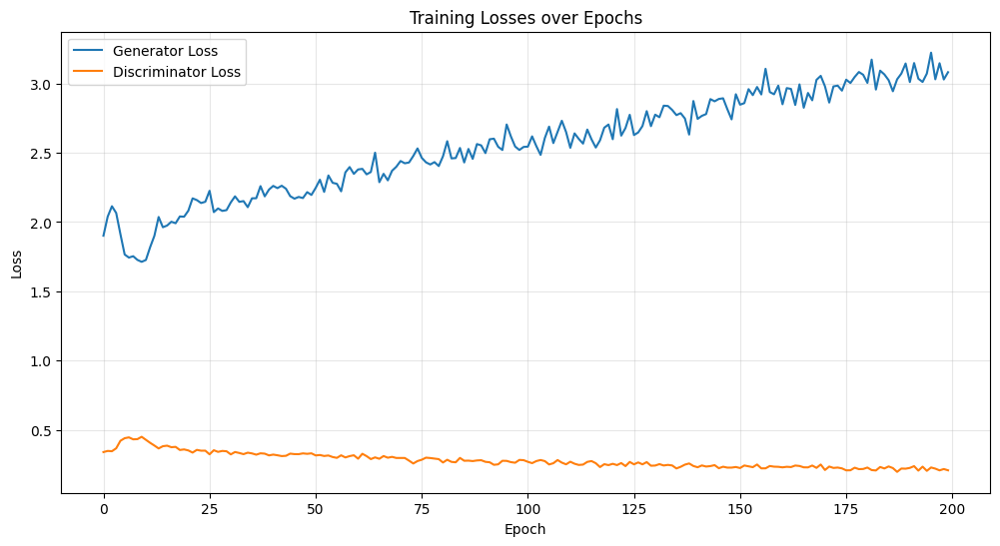

Showing image generation progression over 21 epochs


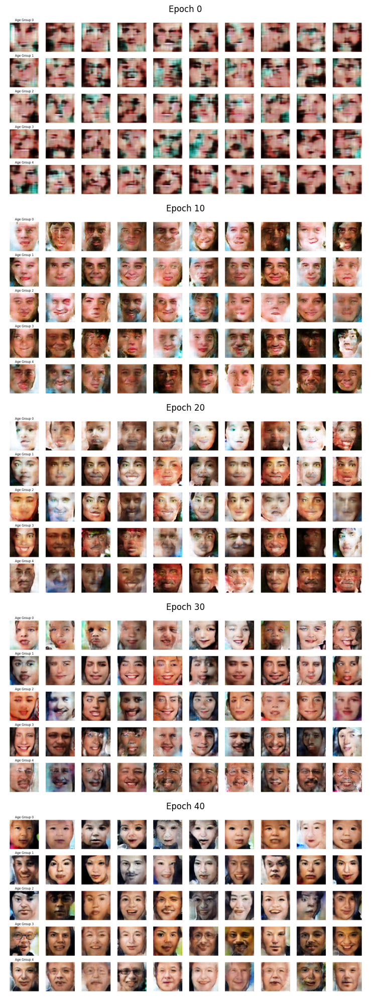

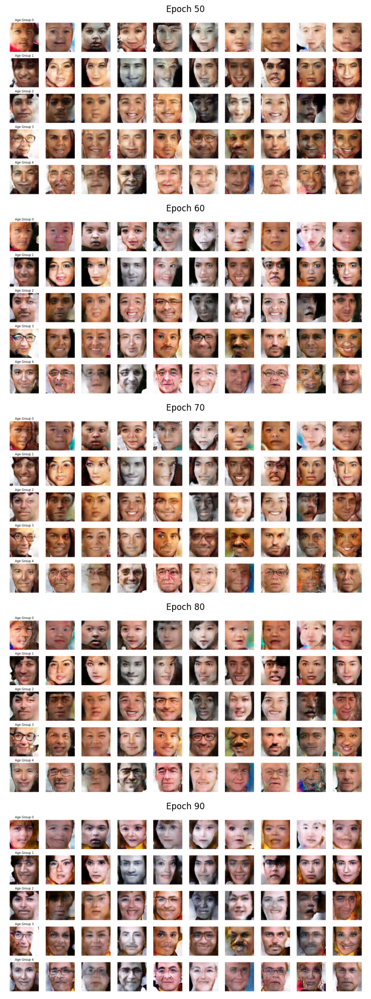

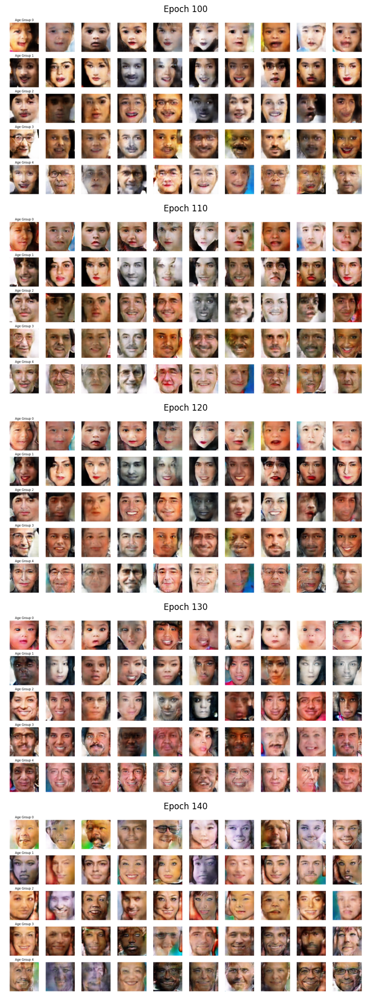

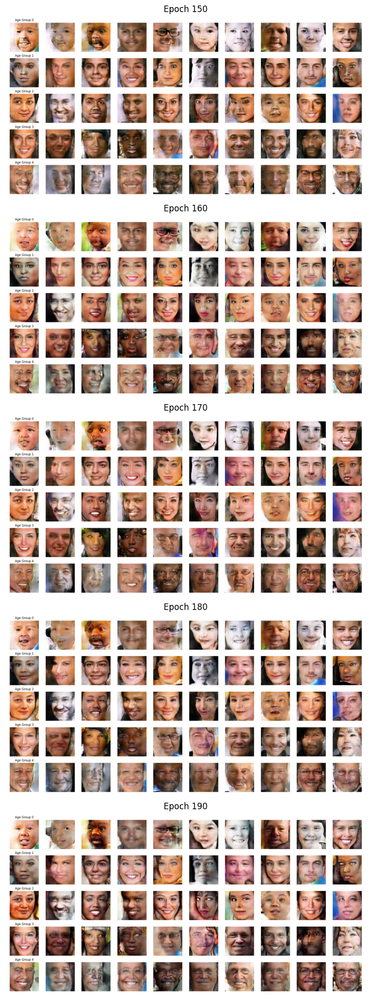

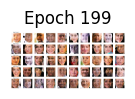

<Figure size 2000x0 with 0 Axes>


--- Training Convergence Analysis ---
Final Generator Loss: 3.0812
Final Discriminator Loss: 0.2079
Generator convergence rate (last 20% epochs): 0.005784 per epoch
Discriminator convergence rate (last 20% epochs): -0.000536 per epoch

Potential Issue: Large gap between generator and discriminator loss
This might indicate training imbalance or mode collapse

Potential Issue: Generator loss is increasing in final epochs
Training may be unstable or experiencing mode collapse
Creating animated GIF of training progression...
No images found for creating animation


In [ ]:
# Training Overview - Run this cell after training to visualize the entire training process

def display_training_overview():
    # Find the latest checkpoint to load loss history
    latest_checkpoint = None
    latest_epoch = -1

    for filename in os.listdir(MODEL_DIR):
        if filename.startswith("checkpoint_epoch_"):
            epoch_num = int(filename.split("_")[-1].split(".")[0])
            if epoch_num > latest_epoch:
                latest_checkpoint = os.path.join(MODEL_DIR, filename)
                latest_epoch = epoch_num

    if latest_checkpoint:
        print(f"Loading loss history from {latest_checkpoint}")
        checkpoint = torch.load(latest_checkpoint)
        G_losses = checkpoint['G_losses']
        D_losses = checkpoint['D_losses']

        # Plot training losses
        plt.figure(figsize=(12, 6))
        plt.plot(G_losses, label="Generator Loss")
        plt.plot(D_losses, label="Discriminator Loss")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.title("Training Losses over Epochs")
        plt.grid(True, alpha=0.3)
        plt.savefig(f"{RESULTS_DIR}/final_losses.png")
        plt.show()
    else:
        print("No checkpoint found to extract loss history")

    # Find all epoch sample images (showing every 10th epoch for clarity)
    epoch_images = []
    epoch_numbers = []

    for filename in os.listdir(RESULTS_DIR):
        if filename.startswith("samples_epoch_") and filename.endswith(".png"):
            try:
                epoch_num = int(filename.split("_")[-1].split(".")[0])
                # Only include every 10th epoch for visualization
                if epoch_num % 10 == 0 or epoch_num == latest_epoch:
                    epoch_images.append(os.path.join(RESULTS_DIR, filename))
                    epoch_numbers.append(epoch_num)
            except:
                continue

    # Sort by epoch number
    sorted_pairs = sorted(zip(epoch_numbers, epoch_images))
    epoch_numbers = [pair[0] for pair in sorted_pairs]
    epoch_images = [pair[1] for pair in sorted_pairs]

    # Display generated images progression
    if epoch_images:
        print(f"Showing image generation progression over {len(epoch_images)} epochs")

        plt.figure(figsize=(20, 4 * min(5, len(epoch_images))))

        for i, (epoch_num, img_path) in enumerate(zip(epoch_numbers, epoch_images)):
            plt.subplot(min(5, len(epoch_images)), 1, i % 5 + 1)
            img = plt.imread(img_path)
            plt.imshow(img)
            plt.title(f"Epoch {epoch_num}")
            plt.axis('off')

            # Save every 5 epochs to avoid oversized figure
            if (i + 1) % 5 == 0 or i == len(epoch_images) - 1:
                plt.tight_layout()
                plt.savefig(f"{RESULTS_DIR}/progression_group_{i//5}.png")
                plt.figure(figsize=(20, 4 * min(5, len(epoch_images) - i - 1)))

        plt.show()
    else:
        print("No epoch sample images found")

    # Training statistics - convergence analysis
    if 'G_losses' in locals() and len(G_losses) > 10:
        # Create convergence metrics
        g_loss_smoothed = np.convolve(G_losses, np.ones(5)/5, mode='valid')
        d_loss_smoothed = np.convolve(D_losses, np.ones(5)/5, mode='valid')

        # Convergence rate (slope of losses over last 20% of training)
        last_fifth = max(1, len(G_losses) // 5)
        g_convergence = (G_losses[-1] - G_losses[-last_fifth]) / last_fifth
        d_convergence = (D_losses[-1] - D_losses[-last_fifth]) / last_fifth

        print("\n--- Training Convergence Analysis ---")
        print(f"Final Generator Loss: {G_losses[-1]:.4f}")
        print(f"Final Discriminator Loss: {D_losses[-1]:.4f}")
        print(f"Generator convergence rate (last 20% epochs): {g_convergence:.6f} per epoch")
        print(f"Discriminator convergence rate (last 20% epochs): {d_convergence:.6f} per epoch")

        # Check for mode collapse or non-convergence signs
        if abs(G_losses[-1] - D_losses[-1]) > 2.0:
            print("\nPotential Issue: Large gap between generator and discriminator loss")
            print("This might indicate training imbalance or mode collapse")

        if abs(g_convergence) < 0.001 and abs(d_convergence) < 0.001:
            print("\nPositive Sign: Training appears to have converged well")
        elif G_losses[-1] > G_losses[-10]:
            print("\nPotential Issue: Generator loss is increasing in final epochs")
            print("Training may be unstable or experiencing mode collapse")

    # Display age interpolation visualization if available
    if os.path.exists(f"{RESULTS_DIR}/age_interpolation.png"):
        plt.figure(figsize=(15, 10))
        img = plt.imread(f"{RESULTS_DIR}/age_interpolation.png")
        plt.imshow(img)
        plt.title("Age Group Interpolation")
        plt.axis('off')
        plt.show()

    # Show same face at different ages if available
    if os.path.exists(f"{RESULTS_DIR}/same_face_different_ages.png"):
        plt.figure(figsize=(15, 5))
        img = plt.imread(f"{RESULTS_DIR}/same_face_different_ages.png")
        plt.imshow(img)
        plt.title("Same Identity at Different Ages")
        plt.axis('off')
        plt.show()

# Run the visualization function
display_training_overview()

# Create an animated GIF of training progression (optional)
try:
    from PIL import Image
    import glob

    print("Creating animated GIF of training progression...")

    # Find all progression images and sort them
    image_paths = []
    for filename in sorted(glob.glob(f"{RESULTS_DIR}/epoch_*.png")):
        try:
            epoch_num = int(filename.split("_")[1].split(".")[0])
            # Only use every 5th epoch to keep file size reasonable
            if epoch_num % 5 == 0:
                image_paths.append(filename)
        except:
            continue

    if image_paths:
        # Create and save GIF
        images = [Image.open(path) for path in sorted(image_paths)]
        images[0].save(
            f"{RESULTS_DIR}/training_animation.gif",
            save_all=True,
            append_images=images[1:],
            duration=300,  # milliseconds per frame
            loop=0  # 0 means loop indefinitely
        )
        print(f"Animated GIF saved to {RESULTS_DIR}/training_animation.gif")
    else:
        print("No images found for creating animation")
except Exception as e:
    print(f"Error creating animation: {e}")
    print("Skipping animation creation")

## **Fake image generation**

Loading model from /content/drive/MyDrive/face_cgan/models/checkpoint_epoch_199.pth
Generating samples using model from epoch 199


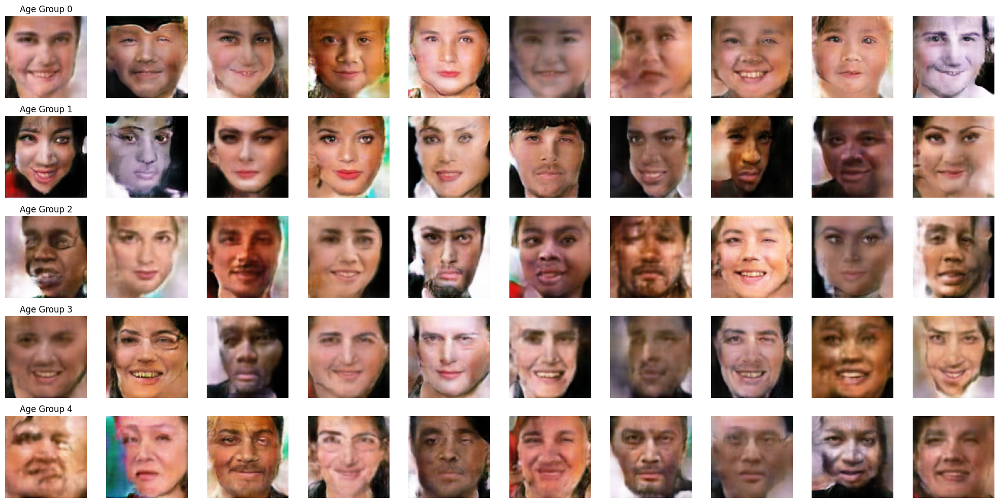

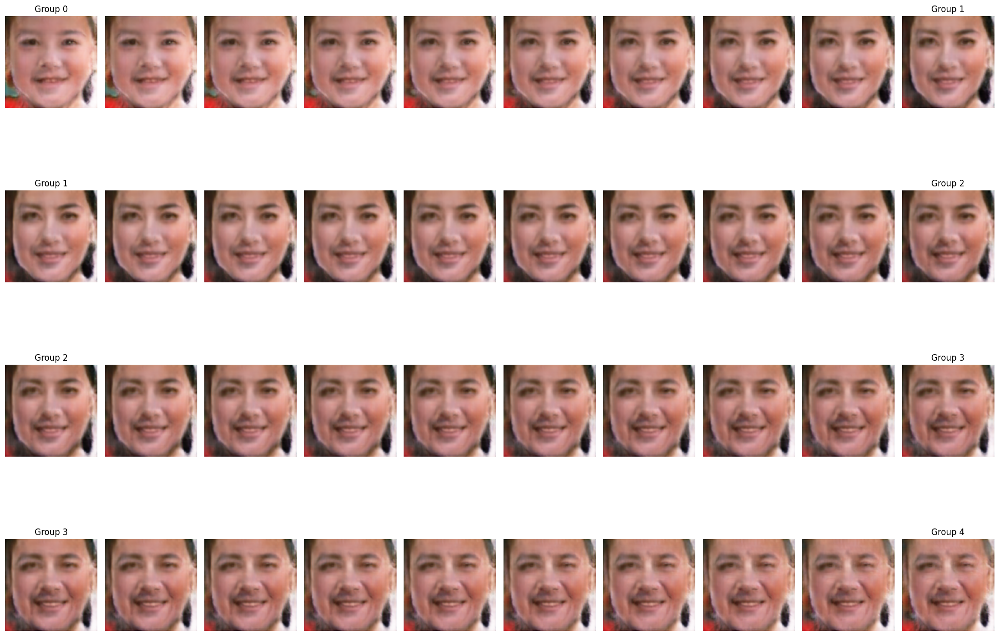

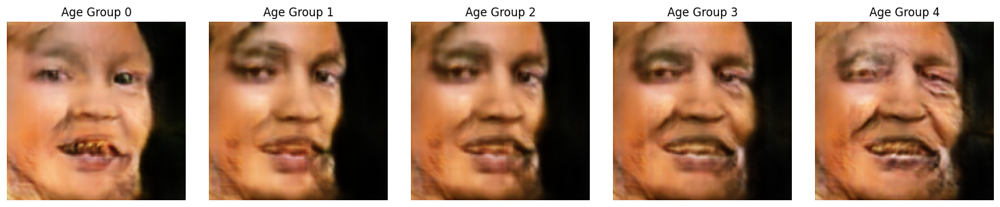

Inference completed!


In [ ]:
# Load the latest model for inference
def load_latest_model():
    latest_checkpoint = None
    latest_epoch = -1

    for filename in os.listdir(MODEL_DIR):
        if filename.startswith("checkpoint_epoch_"):
            epoch_num = int(filename.split("_")[-1].split(".")[0])
            if epoch_num > latest_epoch:
                latest_checkpoint = os.path.join(MODEL_DIR, filename)
                latest_epoch = epoch_num

    if latest_checkpoint:
        print(f"Loading model from {latest_checkpoint}")
        checkpoint = torch.load(latest_checkpoint)

        generator = Generator(latent_dim=LATENT_DIM, n_classes=NUM_AGE_GROUPS).to(device)
        generator.load_state_dict(checkpoint['generator_state_dict'])
        generator.eval()

        return generator, latest_epoch
    else:
        print("No checkpoint found")
        return None, -1

# Generate images for each age group
def generate_images_by_age(generator, num_images=10):
    with torch.no_grad():
        # Create figure
        fig, axs = plt.subplots(NUM_AGE_GROUPS, num_images, figsize=(20, 10))

        for age_group in range(NUM_AGE_GROUPS):
            # Create one-hot encoded labels for this age group
            labels = torch.zeros(num_images, NUM_AGE_GROUPS, device=device)
            labels[:, age_group] = 1

            # Generate random noise
            z = torch.randn(num_images, LATENT_DIM, device=device)

            # Generate images
            gen_imgs = generator(z, labels)

            # Plot images
            for i in range(num_images):
                img = gen_imgs[i].cpu().detach()
                img = img.permute(1, 2, 0).numpy() * 0.5 + 0.5  # Denormalize
                axs[age_group, i].imshow(img)
                axs[age_group, i].axis('off')

            axs[age_group, 0].set_title(f"Age Group {age_group}")

        plt.tight_layout()
        plt.savefig(f"{RESULTS_DIR}/final_samples.png")
        plt.show()

# Function to generate images with age interpolation
def generate_age_interpolation(generator, num_steps=10):
    with torch.no_grad():
        # Fix noise vector
        z = torch.randn(1, LATENT_DIM, device=device)
        z = z.repeat(num_steps, 1)

        # Create figure
        fig, axs = plt.subplots(NUM_AGE_GROUPS-1, num_steps, figsize=(20, 15))

        # Generate transitions between each age group
        for group_idx in range(NUM_AGE_GROUPS-1):
            # Create interpolated labels between age groups
            start_group = group_idx
            end_group = group_idx + 1

            for step in range(num_steps):
                # Interpolate between age groups
                alpha = step / (num_steps - 1)
                labels = torch.zeros(1, NUM_AGE_GROUPS, device=device)
                labels[0, start_group] = 1 - alpha
                labels[0, end_group] = alpha

                # Generate image
                gen_img = generator(z[step:step+1], labels)

                # Plot image
                img = gen_img[0].cpu().detach()
                img = img.permute(1, 2, 0).numpy() * 0.5 + 0.5  # Denormalize
                axs[group_idx, step].imshow(img)
                axs[group_idx, step].axis('off')

                if step == 0:
                    axs[group_idx, step].set_title(f"Group {start_group}")
                elif step == num_steps - 1:
                    axs[group_idx, step].set_title(f"Group {end_group}")

        plt.tight_layout()
        plt.savefig(f"{RESULTS_DIR}/age_interpolation.png")
        plt.show()

# Function to generate the same face with different ages
def generate_same_face_different_ages(generator):
    with torch.no_grad():
        # Fix noise vector for the "identity"
        z = torch.randn(1, LATENT_DIM, device=device)
        z = z.repeat(NUM_AGE_GROUPS, 1)

        # Create figure
        fig, axs = plt.subplots(1, NUM_AGE_GROUPS, figsize=(15, 3))

        # Generate faces for each age group
        for age_group in range(NUM_AGE_GROUPS):
            # Create one-hot encoded label for this age group
            labels = torch.zeros(1, NUM_AGE_GROUPS, device=device)
            labels[0, age_group] = 1

            # Generate image
            gen_img = generator(z[age_group:age_group+1], labels)

            # Plot image
            img = gen_img[0].cpu().detach()
            img = img.permute(1, 2, 0).numpy() * 0.5 + 0.5  # Denormalize
            axs[age_group].imshow(img)
            axs[age_group].set_title(f"Age Group {age_group}")
            axs[age_group].axis('off')

        plt.tight_layout()
        plt.savefig(f"{RESULTS_DIR}/same_face_different_ages.png")
        plt.show()

# Load model and run inference
generator, epoch = load_latest_model()

if generator is not None:
    print(f"Generating samples using model from epoch {epoch}")

    # Generate sample images for each age group
    generate_images_by_age(generator)

    # Generate age interpolation
    generate_age_interpolation(generator)

    # Generate same face with different ages
    generate_same_face_different_ages(generator)

    print("Inference completed!")
else:
    print("Failed to load model for inference")